Github URL:<br/> <br/>


In [2]:
! pip install scikit-learn --upgrade
! pip install aimodelshare --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached scikit_learn-1.2.1-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (9.8 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.24.2
    Uninstalling scikit-learn-0.24.2:
      Successfully uninstalled scikit-learn-0.24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
skl2onnx 1.13 requires scikit-learn<=1.1.1, but you have scikit-learn 1.2.1 which is incompatible.
aimodelshare 0.0.178 requires scikit-learn==0.24.2, but you have scikit-learn 1.2.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached scikit_learn-0.24.2-cp38-cp38-manylinux2010_x86_64.whl (24.9 MB)
  Attempting uninstall: scikit-learn
    Found existing instal

In [3]:
import aimodelshare as ai

In [54]:
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.spatial.distance import pdist, squareform 

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.preprocessing import scale
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer

from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.feature_selection import RFE

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

import keras
from keras.models import Sequential
from keras.layers import Dense, Activation

In [6]:
# importing the zipfile module
#from zipfile import ZipFile
#path_data = "/Users/takuro/Desktop/Files/Columbia/"\
#            + "01. Class materials/18. Project in Advanced Machine Learning/"\
#           + "02. HW/HM1/world_happiness_competition_data.zip"

# loading the temp.zip and creating a zip object
#with ZipFile(path_data, 'r') as zObject:
  
    # Extracting all the members of the zip 
    # into a specific location.
#    zObject.extractall()

#Get competition data from course folder and unzip
# importing the zipfile module
from zipfile import ZipFile
  
# loading the temp.zip and creating a zip object
with ZipFile("world_happiness_competition_data.zip", 'r') as zObject:
  
    # Extracting all the members of the zip 
    # into a specific location.
    zObject.extractall()

In [7]:
X_train = pd.read_csv('world_happiness_competition_data/X_train.csv')
X_test = pd.read_csv('world_happiness_competition_data/X_test.csv')
y_train = pd.read_csv('world_happiness_competition_data/y_train.csv')
y_train_labels = y_train.idxmax(axis=1)

X_train.head()

,Country or region,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,name,region,sub-region,Terrorist_attacks
0,Peru,0.960,1.274,0.854,0.455,0.083,0.027,Peru,Americas,Latin America and the Caribbean,18.000000
1,Nicaragua,0.694,1.325,0.835,0.435,0.200,0.127,Nicaragua,Americas,Latin America and the Caribbean,125.611111
2,Greece,1.181,1.156,0.999,0.067,0.000,0.034,Greece,Europe,Southern Europe,112.000000
3,Qatar,1.684,1.313,0.871,0.555,0.220,0.167,Qatar,Asia,Western Asia,57.333333
4,Uzbekistan,0.745,1.529,0.756,0.631,0.322,0.240,Uzbekistan,Asia,Central Asia,125.611111


In [8]:
y_train.head()

,Average,High,Low,Very High,Very Low
0,1,0,0,0,0
1,0,1,0,0,0
2,1,0,0,0,0
3,0,0,0,1,0
4,0,1,0,0,0


In [9]:
# We create the preprocessing pipelines for both numeric and categorical data.

numeric_features = X_train.drop(['Country or region', 'name', 'region', 'sub-region'], axis=1)
numeric_features=numeric_features.columns.tolist()

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_features = ['region', 'sub-region']

#Replacing missing values with Modal value and then one hot encoding.
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# final preprocessor object set up with ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

#Fit your preprocessor object
preprocess = preprocessor.fit(X_train) 

In [18]:
# Scaling
scaler = StandardScaler().fit(preprocessor(X_train))
X_pr_sc = scaler.transform(preprocessor(X_train))

In [10]:
# Write function to transform data with preprocessor

def preprocessor(data):
    data.drop(['Country or region', 'name'], axis=1)
    preprocessed_data = preprocess.transform(data)
    return preprocessed_data

In [65]:
def preprocessor_sc(data):
    data.drop(['Country or region', 'name'], axis=1)
    preprocessed_sc_data = scaler.transform(preprocess.transform(data))
    return preprocessed_sc_data

In [11]:
# Replace happiness category to number for visualization purpose
y_train_labels_num = y_train_labels.replace(["Very Low", "Low", "Average", "High", "Very High"],[0, 1, 2, 3, 4])
y_train_labels_num.head()

0    2
1    3
2    2
3    4
4    3
dtype: int64

## Part 1: Bivariate results

### (1) Relationship between GDP per capita and happiness index

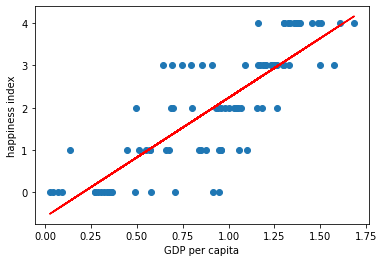

In [12]:
plt.scatter(X_train['GDP per capita'], y_train_labels_num)
plt.xlabel('GDP per capita')
plt.ylabel('happiness index')

m, b = np.polyfit(X_train['GDP per capita'], y_train_labels_num, deg=1)
plt.plot(X_train['GDP per capita'], m * X_train['GDP per capita'] + b, color = 'red')

### (2) Relationship between Perceptions of corruption and happiness index

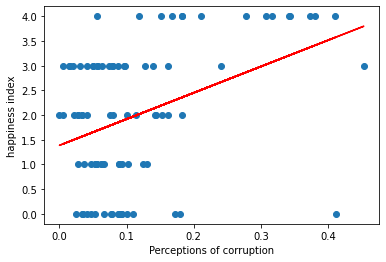

In [13]:
plt.scatter(X_train['Perceptions of corruption'], y_train_labels_num)
plt.xlabel('Perceptions of corruption')
plt.ylabel('happiness index')

m, b = np.polyfit(X_train['Perceptions of corruption'], y_train_labels_num, deg=1)
plt.plot(X_train['Perceptions of corruption'], m * X_train['Perceptions of corruption'] + b, color = 'red')

### (3) Relationship between Terrorist_attacks and happiness index

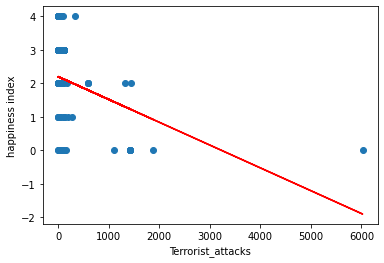

In [14]:
plt.scatter(X_train["Terrorist_attacks"], y_train_labels_num)
plt.xlabel('Terrorist_attacks')
plt.ylabel('happiness index')

m, b = np.polyfit(X_train['Terrorist_attacks'], y_train_labels_num, deg=1)
plt.plot(X_train['Terrorist_attacks'], m * X_train['Terrorist_attacks'] + b, color = 'red')

## Part 2: Models that allow for automatic feature selection

### (1) RFE

In [15]:
# RFE to find 3 features that help mode predict the best:

estimator = LogisticRegression(multi_class="multinomial",solver="lbfgs").fit(preprocessor(X_train), y_train_labels)

selector = RFE(estimator, n_features_to_select = 3, step = 1) # step tells RFE how many features to remove each time model features are evaluated

selector = selector.fit(preprocessor(X_train), y_train_labels) # fit RFE estimator.

print("Num Features: " + str(selector.n_features_))
print("Selected Features: " + str(selector.support_)) # T/F for top three features
print("Feature Ranking: " + str(selector.ranking_))

Num Features: 3
Selected Features: [ True  True  True False False False False False False False False False
 False False False False False False False False False False False False
 False False]
Feature Ranking: [ 1  1  1  3  6 10  2 20 11  4 16 23 24 13 21 12 18 15 22 19  9  7 14  8
 17  5]


In [16]:
z = selector.support_
newX_RFE_processed = preprocessor(X_train).compress(z, axis = 1)

In [17]:
logreg = LogisticRegression(multi_class="multinomial",solver="lbfgs")
logreg.fit(newX_RFE_processed, y_train_labels)

print(logreg.coef_)
print(np.unique(y_train_labels))

[[-0.05635386 -0.61844704  0.11540243]
 [ 0.0662443   1.04374022  0.62128822]
 [-0.35180645 -0.89219442 -0.80164643]
 [ 1.82935804  1.60447686  1.14454455]
 [-1.48744203 -1.13757561 -1.07958877]]
['Average' 'High' 'Low' 'Very High' 'Very Low']


#### The result shows that GDP per capita, 	Social support, and Healthy life expectancy are the three most helpful variables to predict happiness categories. They are all positively correlates with the degree of happiness.

### (2) PCA

In [19]:
pca = PCA()
pca.fit_transform(X_pr_sc)

array([[-5.12258759e-01, -9.81570436e-01, -3.06703770e+00, ...,
         1.64269660e-16,  1.22277587e-16, -1.37619111e-16],
       [-4.86254841e-01, -4.23663836e-01, -2.61754123e+00, ...,
        -2.37609609e-16,  1.78768623e-17,  1.49858713e-16],
       [-7.70490952e-01, -2.83065092e+00, -1.82259678e-01, ...,
         5.19277800e-16, -3.55338035e-17, -1.51845449e-16],
       ...,
       [-2.96539330e+00, -3.30246284e-01,  1.88965846e+00, ...,
         1.16453246e-16,  1.04892772e-16, -8.22197030e-17],
       [-8.45470572e-01,  1.30379685e+00, -1.23613544e+00, ...,
         1.05399102e-16, -3.11240137e-17,  1.46144724e-16],
       [ 2.77554260e+00, -3.84519527e-01,  9.89651797e-01, ...,
         3.78348109e-16, -8.06061212e-17, -1.89847256e-16]])

array([0.19598928, 0.29673134, 0.38939251, 0.47875315, 0.54755775,
       0.60737227, 0.65764511, 0.7012832 , 0.74339931, 0.7845549 ,
       0.82547899, 0.86596534, 0.90557337, 0.93098612, 0.95062502,
       0.9667472 , 0.97982424, 0.99024121, 0.99650019, 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        ])

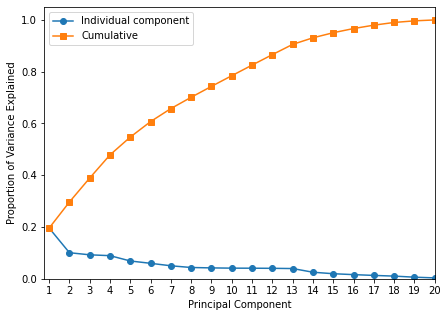

In [20]:
plt.figure(figsize=(7,5))

plt.plot(range(1,27), pca.explained_variance_ratio_, '-o', label='Individual component')
plt.plot(range(1,27), np.cumsum(pca.explained_variance_ratio_), '-s', label='Cumulative')

plt.ylabel('Proportion of Variance Explained')
plt.xlabel('Principal Component')
plt.xlim(0.75,4.25)
plt.ylim(0,1.05)
plt.xticks(range(1,21))
plt.legend(loc = 2);

np.cumsum(pca.explained_variance_ratio_)

I would include the first two components in the model, considering the elbow in the figure.

In [21]:
newX2_RFE_processed = preprocessor(X_train).compress([1,2], axis = 1)

In [22]:
logreg.fit(newX2_RFE_processed, y_train_labels)

print(logreg.coef_)
print(np.unique(y_train_labels))

[[ 0.09442735 -0.61091532]
 [ 0.35246617  1.08138203]
 [-0.70126144 -0.93472412]
 [ 2.1689666   1.69846008]
 [-1.91459869 -1.23420267]]
['Average' 'High' 'Low' 'Very High' 'Very Low']


#### Based on PCA, I included GDP per capita and Social support in the model. They are all positively correlates with the degree of happiness.

## Part 3: Fitting models

### - Attempts by myself

### (1) Random forests

In [25]:
param_grid1 = {'n_estimators': np.arange(1, 500, 15)}
grid1 = GridSearchCV(RandomForestClassifier(max_depth=3), param_grid=param_grid1, cv=5)
grid1.fit(preprocessor(X_train), y_train_labels)

print("best mean cross-validation score: {:.3f}".format(grid1.best_score_))
print("best parameters: {}".format(grid1.best_params_))
print("test-set score: {:.3f}".format(grid1.score(preprocessor(X_train), y_train_labels)))

best mean cross-validation score: 0.659
best parameters: {'n_estimators': 181}
test-set score: 0.852


In [26]:
model1 = RandomForestClassifier(n_estimators=181, max_depth=3)
model1.fit(preprocessor(X_train), y_train_labels)
model1.score(preprocessor(X_train), y_train_labels)

0.8636363636363636

In [67]:
import aimodelshare as ai
ai.export_preprocessor(preprocessor,"") 

Your preprocessor is now saved to 'preprocessor.zip'


In [28]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

# Check how many preprocessed input features are there?
from skl2onnx.common.data_types import FloatTensorType

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  #Insert correct number of preprocessed features

onnx_model = model_to_onnx(model1, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("model1.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [30]:
from aimodelshare.aws import set_credentials

#This is the unique rest api that powers this World Happiness Classification Playground -- make sure to update the apiurl for new competition deployments
apiurl="https://e2w6gh3id1.execute-api.us-east-2.amazonaws.com/prod/m"

set_credentials(apiurl=apiurl)

AI Modelshare Username:··········
AI Modelshare Password:··········
AI Model Share login credentials set successfully.


In [31]:
mycompetition= ai.Competition(apiurl)

In [32]:
#-- Generate predicted values (Model 1)
prediction_labels = model1.predict(preprocessor(X_test))

# Submit Model 1 to Competition Leaderboard
mycompetition.submit_model(model_filepath = "model1.onnx",
                                 preprocessor_filepath="preprocessor.zip",
                                 prediction_submission=prediction_labels,
                                 custom_metadata={"team":"3"})

Insert search tags to help users find your model (optional): 
Provide any useful notes about your model (optional): 

Your model has been submitted as model version 704

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.org/detail/model:3164


In [33]:
# Get leaderboard

data = mycompetition.get_leaderboard()
mycompetition.stylize_leaderboard(data)

### (2) Support vector machines

In [46]:
param_grid2 = {'gamma': np.arange(1e-05, 1e-03, 1e-05)}
grid2 = GridSearchCV(SVC(kernel='rbf', C=1E6), param_grid = param_grid2, cv=5)
grid2.fit(X_pr_sc, y_train_labels)

print("best mean cross-validation score: {:.3f}".format(grid2.best_score_))
print("best parameters: {}".format(grid2.best_params_))

best mean cross-validation score: 0.613
best parameters: {'gamma': 4e-05}


In [120]:
model2 = SVC(kernel='rbf', gamma=4e-05, C=1E6)
model2.fit(X_pr_sc, y_train_labels)
model2.score(X_pr_sc, y_train_labels)

0.9204545454545454

In [121]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

# Check how many preprocessed input features are there?
from skl2onnx.common.data_types import FloatTensorType

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  #Insert correct number of preprocessed features

onnx_model = model_to_onnx(model2, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("model2.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [122]:
import aimodelshare as ai
ai.export_preprocessor(preprocessor_sc,"") 

Your preprocessor is now saved to 'preprocessor.zip'


In [123]:
#-- Generate predicted values (Model 2)
prediction_labels = model2.predict(preprocessor(X_test))

# Submit Model 2 to Competition Leaderboard
mycompetition.submit_model(model_filepath = "model2.onnx",
                                 preprocessor_filepath="preprocessor.zip",
                                 prediction_submission=prediction_labels,
                                 custom_metadata={"team":"3"})

Insert search tags to help users find your model (optional): 
Provide any useful notes about your model (optional): 

Your model has been submitted as model version 759

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.org/detail/model:3164


In [124]:
# Get leaderboard

data = mycompetition.get_leaderboard()
mycompetition.stylize_leaderboard(data)

### (3) Neural network

In [39]:
feature_count=preprocessor(X_train).shape[1] #count features in input data

keras_model1 = Sequential()
keras_model1.add(Dense(128, input_dim=feature_count, activation='relu'))
keras_model1.add(Dense(128, activation='relu'))
keras_model1.add(Dense(128, activation='relu'))
keras_model1.add(Dense(32, activation='relu'))

keras_model1.add(Dense(5, activation='softmax')) 
                                            
# Compile model
keras_model1.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])

# Fitting the NN to the Training set
keras_model1.fit(preprocessor(X_train), y_train, ## Note that keras models require a one-hot-encoded y_train object
               batch_size = 20, 
               epochs = 300, validation_split=0.25)  

Epoch 1/300
4/4 [==============================] - 1s 55ms/step - loss: 1.6027 - accuracy: 0.3030 - val_loss: 1.6193 - val_accuracy: 0.2273
Epoch 2/300
4/4 [==============================] - 0s 9ms/step - loss: 1.5945 - accuracy: 0.3182 - val_loss: 1.6149 - val_accuracy: 0.2273
Epoch 3/300
4/4 [==============================] - 0s 9ms/step - loss: 1.5857 - accuracy: 0.3333 - val_loss: 1.6090 - val_accuracy: 0.2273
Epoch 4/300
4/4 [==============================] - 0s 10ms/step - loss: 1.5784 - accuracy: 0.3485 - val_loss: 1.6000 - val_accuracy: 0.2273
Epoch 5/300
4/4 [==============================] - 0s 12ms/step - loss: 1.5682 - accuracy: 0.3485 - val_loss: 1.5946 - val_accuracy: 0.2273
Epoch 6/300
4/4 [==============================] - 0s 13ms/step - loss: 1.5603 - accuracy: 0.3636 - val_loss: 1.5879 - val_accuracy: 0.2727
Epoch 7/300
4/4 [==============================] - 0s 14ms/step - loss: 1.5520 - accuracy: 0.3939 - val_loss: 1.5808 - val_accuracy: 0.2727
Epoch 8/300
4/4 [=====

In [40]:
# Save keras model to ONNX file 

from aimodelshare.aimsonnx import model_to_onnx

onnx_model = model_to_onnx(keras_model1, framework='keras',
                          transfer_learning=False,
                          deep_learning=True)

with open("model3.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [41]:
#-- Generate predicted values (Model 3)
prediction_labels = model1.predict(preprocessor(X_test))

# Submit Model 3 to Competition Leaderboard
mycompetition.submit_model(model_filepath = "model3.onnx",
                                 preprocessor_filepath="preprocessor.zip",
                                 prediction_submission=prediction_labels,
                                 custom_metadata={"team":"3"})

Insert search tags to help users find your model (optional): 
Provide any useful notes about your model (optional): 

Your model has been submitted as model version 707

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.org/detail/model:3164


In [42]:
# Get leaderboard

data = mycompetition.get_leaderboard()
mycompetition.stylize_leaderboard(data)

### - Attempts after learning from the team

### (1) Gradient Boosting Classifier

In [71]:
param_grid4 = {'learning_rate': np.arange(0.01, 0.05, 0.01)}
grid4 = GridSearchCV(GradientBoostingClassifier(n_estimators=5000,
    max_depth=1, random_state=0), param_grid = param_grid4, cv=5)
grid4.fit(X_pr_sc, y_train_labels)

print("best mean cross-validation score: {:.3f}".format(grid4.best_score_))
print("best parameters: {}".format(grid4.best_params_))

best mean cross-validation score: 0.602
best parameters: {'learning_rate': 0.02}


In [72]:
model4 = GradientBoostingClassifier(n_estimators=5000, learning_rate=0.02, max_depth=1, random_state=0)
model4.fit(X_pr_sc, y_train_labels)
model4.score(X_pr_sc, y_train_labels)

1.0

In [73]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

# Check how many preprocessed input features are there?
from skl2onnx.common.data_types import FloatTensorType

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  #Insert correct number of preprocessed features

onnx_model = model_to_onnx(model4, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("model4.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [74]:
import aimodelshare as ai
ai.export_preprocessor(preprocessor_sc,"") 

Your preprocessor is now saved to 'preprocessor.zip'


In [75]:
#-- Generate predicted values (Model 4)
prediction_labels = model4.predict(preprocessor_sc(X_test))

# Submit Model 4 to Competition Leaderboard
mycompetition.submit_model(model_filepath = "model4.onnx",
                                 preprocessor_filepath="preprocessor.zip",
                                 prediction_submission=prediction_labels,
                                 custom_metadata={"team":"3"})

Insert search tags to help users find your model (optional): 
Provide any useful notes about your model (optional): 

Your model has been submitted as model version 727

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.org/detail/model:3164


In [76]:
# Get leaderboard

data = mycompetition.get_leaderboard()
mycompetition.stylize_leaderboard(data)

### (2) Random Forests


In [88]:
param_grid5 = {'n_estimators': np.arange(1000, 2000, 100)}
grid5 = GridSearchCV(RandomForestClassifier(max_depth=3), param_grid=param_grid5, cv=10)
grid5.fit(preprocessor(X_train), y_train_labels)

print("best mean cross-validation score: {:.3f}".format(grid5.best_score_))
print("best parameters: {}".format(grid5.best_params_))
print("test-set score: {:.3f}".format(grid5.score(preprocessor(X_train), y_train_labels)))

best mean cross-validation score: 0.649
best parameters: {'n_estimators': 1100}
test-set score: 0.852


In [89]:
model5 = RandomForestClassifier(n_estimators=1100, max_depth=3)
model5.fit(preprocessor(X_train), y_train_labels)
model5.score(preprocessor(X_train), y_train_labels)

0.8522727272727273

In [90]:
import aimodelshare as ai
ai.export_preprocessor(preprocessor,"") 

Your preprocessor is now saved to 'preprocessor.zip'


In [91]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

# Check how many preprocessed input features are there?
from skl2onnx.common.data_types import FloatTensorType

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  #Insert correct number of preprocessed features

onnx_model = model_to_onnx(model4, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("model5.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [92]:
#-- Generate predicted values (Model 5)
prediction_labels = model5.predict(preprocessor_sc(X_test))

# Submit Model 5 to Competition Leaderboard
mycompetition.submit_model(model_filepath = "model5.onnx",
                                 preprocessor_filepath="preprocessor.zip",
                                 prediction_submission=prediction_labels,
                                 custom_metadata={"team":"3"})

Insert search tags to help users find your model (optional): 
Provide any useful notes about your model (optional): 

Your model has been submitted as model version 747

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.org/detail/model:3164


In [93]:
# Get leaderboard

data = mycompetition.get_leaderboard()
mycompetition.stylize_leaderboard(data)

### (3) Support Vector Machine

In [112]:
param_grid6 = {'gamma': np.arange(1e-5, 1e-3, 1e-5)}
grid6 = GridSearchCV(SVC(kernel='rbf', C=1E6), param_grid = param_grid6, cv=10)
grid6.fit(X_pr_sc, y_train_labels)

print("best mean cross-validation score: {:.3f}".format(grid6.best_score_))
print("best parameters: {}".format(grid6.best_params_))

best mean cross-validation score: 0.565
best parameters: {'gamma': 0.00019}


In [115]:
model6 = SVC(kernel='rbf', gamma=0.00019, C=1E3)
model6.fit(X_pr_sc, y_train_labels)
model6.score(X_pr_sc, y_train_labels)

0.8409090909090909

In [116]:
# Save sklearn model to local ONNX file
from aimodelshare.aimsonnx import model_to_onnx

# Check how many preprocessed input features are there?
from skl2onnx.common.data_types import FloatTensorType

feature_count=preprocessor(X_test).shape[1] #Get count of preprocessed features
initial_type = [('float_input', FloatTensorType([None, feature_count]))]  #Insert correct number of preprocessed features

onnx_model = model_to_onnx(model6, framework='sklearn',
                          initial_types=initial_type,
                          transfer_learning=False,
                          deep_learning=False)

with open("model6.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())

In [117]:
import aimodelshare as ai
ai.export_preprocessor(preprocessor_sc,"") 

Your preprocessor is now saved to 'preprocessor.zip'


In [118]:
#-- Generate predicted values (Model 2)
prediction_labels = model6.predict(preprocessor(X_test))

# Submit Model 2 to Competition Leaderboard
mycompetition.submit_model(model_filepath = "model6.onnx",
                                 preprocessor_filepath="preprocessor.zip",
                                 prediction_submission=prediction_labels,
                                 custom_metadata={"team":"3"})

Insert search tags to help users find your model (optional): 
Provide any useful notes about your model (optional): 

Your model has been submitted as model version 754

To submit code used to create this model or to view current leaderboard navigate to Model Playground: 

 https://www.modelshare.org/detail/model:3164


In [119]:
# Get leaderboard

data = mycompetition.get_leaderboard()
mycompetition.stylize_leaderboard(data)

In [142]:
prediction_labels = model2.predict(preprocessor(X_test))
prediction_submit = pd.DataFrame(prediction_labels, columns = ['predictions'])
prediction_submit.to_csv('predictions.csv', index=False)

,predictions
0,Very Low
1,Very Low
2,Low
3,Very High
4,Very High
...,...
63,Low
64,Average
65,Low
66,Low


### - Discussion

I've tried Random Forests Classifier, Support Vector Machine, Neural Network, Gradient Booster Classifer. Among them, Support Vector Machine performed the best, but the performances were not very different. The successful hyper-parameters for my Support Vector Machine model were gamma=4e-05, C=1E6.